# discription of the data in the diabetes dataset

In [1477]:
import numpy as np

In [1478]:
import pandas as pd

In [1479]:
import matplotlib.pyplot as plt

In [1480]:
import seaborn as sns

In [1481]:
diab_data = pd.read_csv('diabetes (1).csv')
diab_data

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.9,0.171,63,0
764,2,122,70,27,0,36.8,0.340,27,0
765,5,121,72,23,112,26.2,0.245,30,0
766,1,126,60,0,0,30.1,0.349,47,1


In [1482]:
diab_data.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,120.894531,69.105469,20.536458,79.799479,31.992578,0.471876,33.240885,0.348958
std,3.369578,31.972618,19.355807,15.952218,115.244002,7.884160,0.331329,11.760232,0.476951
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


In [1483]:
diab_data[diab_data['Outcome'] == 1].describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,268.000000,268.000000,268.000000,268.000000,268.000000,268.000000,268.000000,268.000000,268.0
mean,4.865672,141.257463,70.824627,22.164179,100.335821,35.142537,0.550500,37.067164,1.0
std,3.741239,31.939622,21.491812,17.679711,138.689125,7.262967,0.372354,10.968254,0.0
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.088000,21.000000,1.0
25%,1.750000,119.000000,66.000000,0.000000,0.000000,30.800000,0.262500,28.000000,1.0
50%,4.000000,140.000000,74.000000,27.000000,0.000000,34.250000,0.449000,36.000000,1.0
75%,8.000000,167.000000,82.000000,36.000000,167.250000,38.775000,0.728000,44.000000,1.0
max,17.000000,199.000000,114.000000,99.000000,846.000000,67.100000,2.420000,70.000000,1.0


# mean values acc to outcome

In [1485]:
diab_data.groupby(['Outcome']).mean()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
Outcome,,,,,,,,
0,3.298000,109.980000,68.184000,19.664000,68.792000,30.304200,0.429734,31.190000
1,4.865672,141.257463,70.824627,22.164179,100.335821,35.142537,0.550500,37.067164


# coeff of variation of parameters in the dataset

<Axes: xlabel='idx', ylabel='COV'>

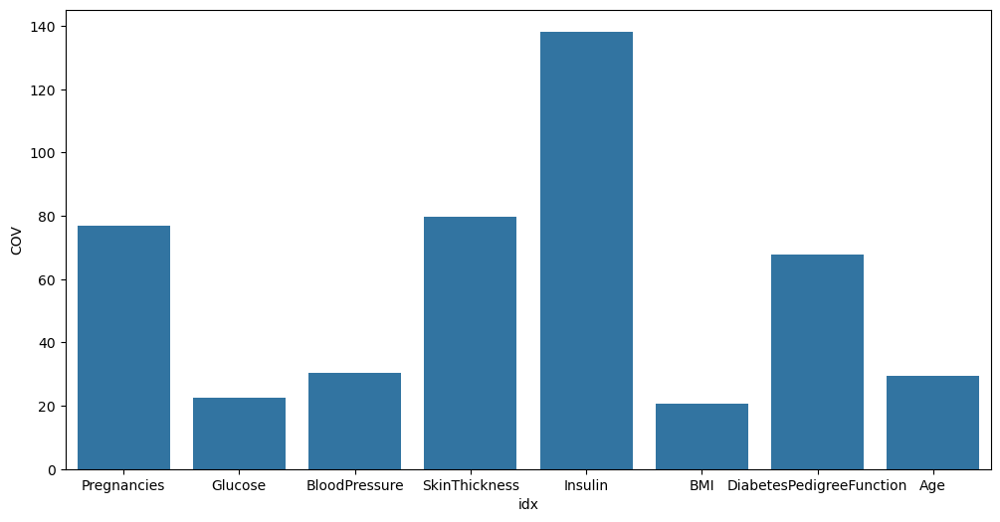

In [1487]:
diab_cov = pd.DataFrame(diab_data[diab_data['Outcome'] == 1].std()*100/diab_data[diab_data['Outcome'] == 1].mean())
diab_cov.columns = ['COV']
diab_cov.index.name = 'idx'
diab_cov = diab_cov.drop(['Outcome'])
plt.figure(figsize = (12,6))
sns.barplot(x = 'idx',y = 'COV',data = diab_cov)

# Ratio of people having diabetes acc to their age

Text(0, 0.5, 'ration of having glucose')

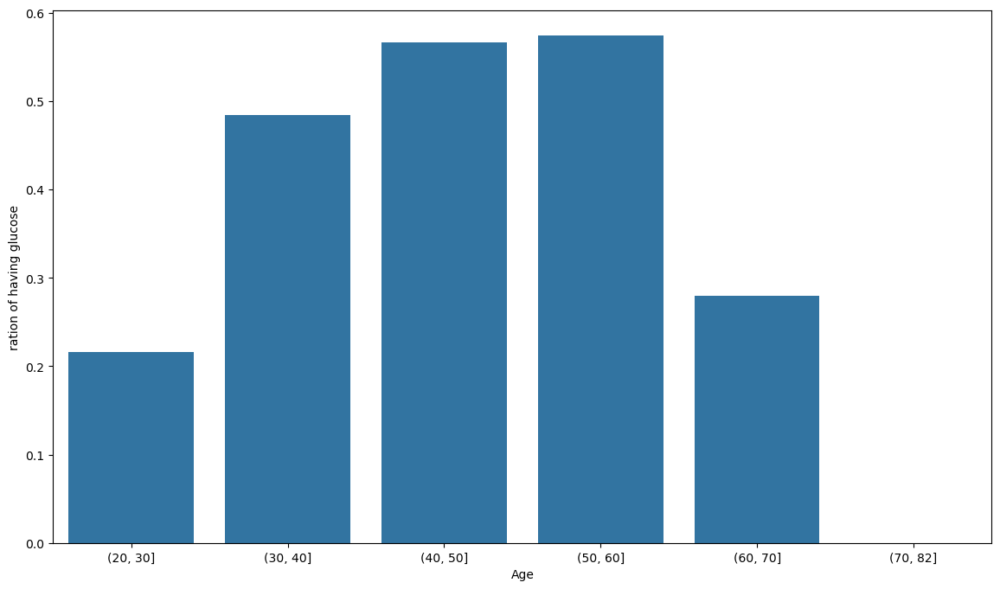

In [1489]:
diab_age = pd.DataFrame(data=diab_data[diab_data['Outcome'] == 1]['Age'])

ratio_age = diab_age.groupby(pd.cut(diab_age['Age'], [20,30,40, 50,60,70,82]),observed=True)['Age'].count()/diab_data.groupby(pd.cut(diab_data['Age'], [ 20,30,40, 50, 60,70, 82]),observed=True)['Age'].count()
ratio_age = pd.DataFrame(data = ratio_age)
ratio_age.columns = ['ratio']
ratio_age
lis = list(range(21))
plt.figure(figsize=(14,8))
plt.tight_layout()
sns.barplot(x = 'Age',y = 'ratio',data = ratio_age,estimator=np.mean)
plt.ylabel('ration of having glucose')

# FINDING THE CORRELATION OF ALL THE ELEMENTS TO OUTCOME

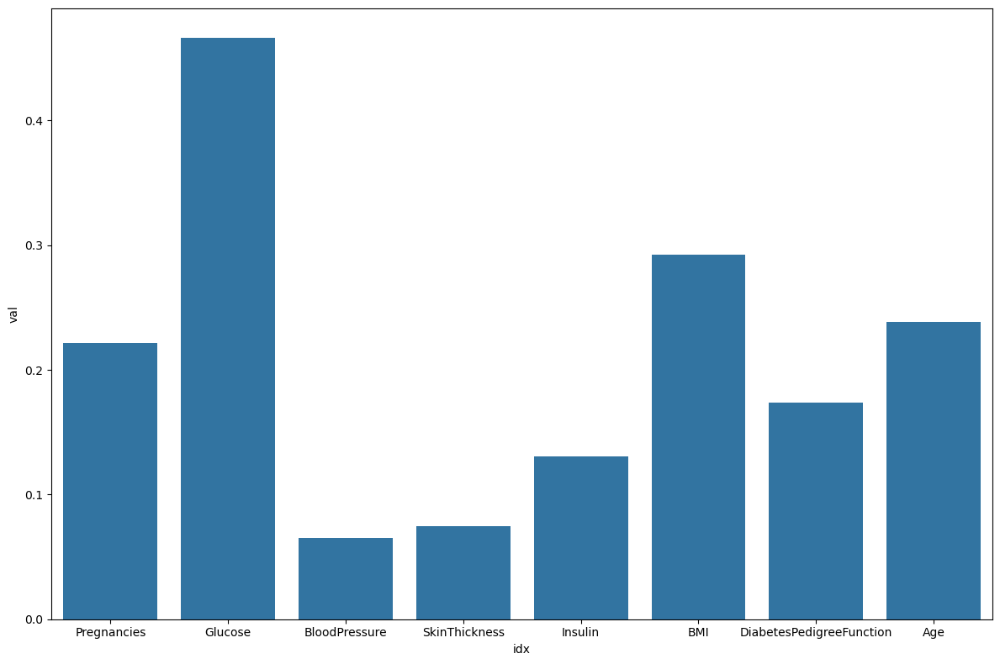

In [1491]:
corr_diab = diab_data.corr()['Outcome']
corr_diab.index.name = 'idx'
corr_diab.columns = ['val','vals']
corr_out = pd.DataFrame(data = corr_diab.values,index = corr_diab.index,columns=  ['val'])
corr_out = corr_out.drop('Outcome')

plt.figure(figsize=(12,8))
sns.barplot(x = 'idx',y = 'val',data = corr_out)
plt.tight_layout()



gluecose level is a imp factor for diabetes highly correlated

     Glucose
0        148
2        183
4        137
6         78
8        197
..       ...
755      128
757      123
759      190
761      170
766      126

[268 rows x 1 columns]


Text(0, 0.5, 'ration of having glucose')

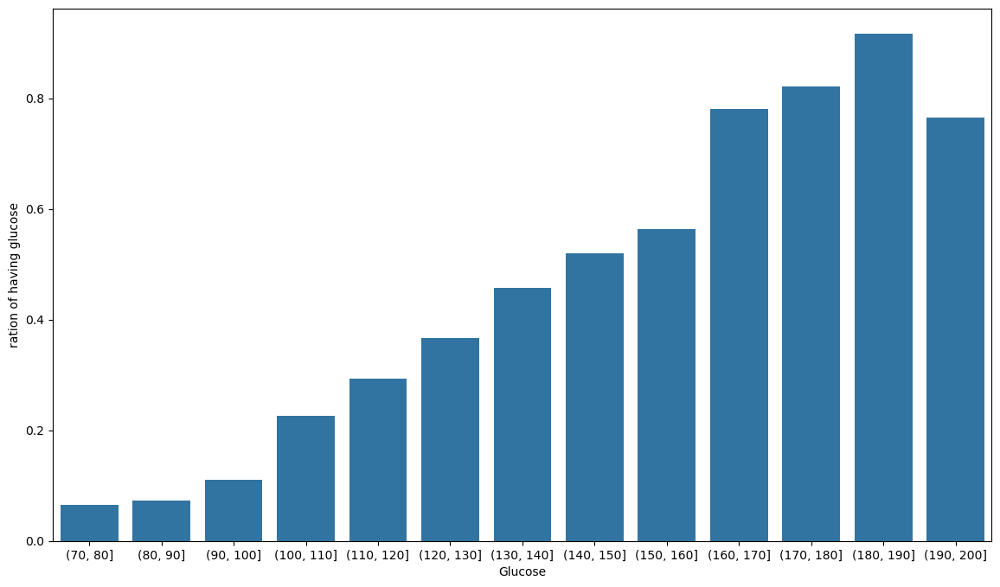

In [1493]:
diab_age = pd.DataFrame(data=diab_data[diab_data['Outcome'] == 1]['Glucose'])
print(diab_age)
ratio_gluc = diab_age.groupby(pd.cut(diab_age['Glucose'], [70,80,90,100,110,120,130,140,150,160,170,180,190,200]),observed=True)['Glucose'].count()/diab_data.groupby(pd.cut(diab_data['Glucose'], [70,80,90,100,110,120,130,140,150,160,170,180,190,200]),observed=True)['Glucose'].count()
ratio_gluc = pd.DataFrame(data = ratio_gluc)
ratio_gluc.columns = ['ratio']
ratio_gluc
lis = list(range(21))
plt.figure(figsize=(14,8))
plt.tight_layout()
sns.barplot(x = 'Glucose',y = 'ratio',data = ratio_gluc,estimator=np.mean)
plt.ylabel('ration of having glucose')


from the graph it is easily visible that as the glucose is increasing the chances of having diabetes is also increasing

<Figure size 2000x1000 with 0 Axes>

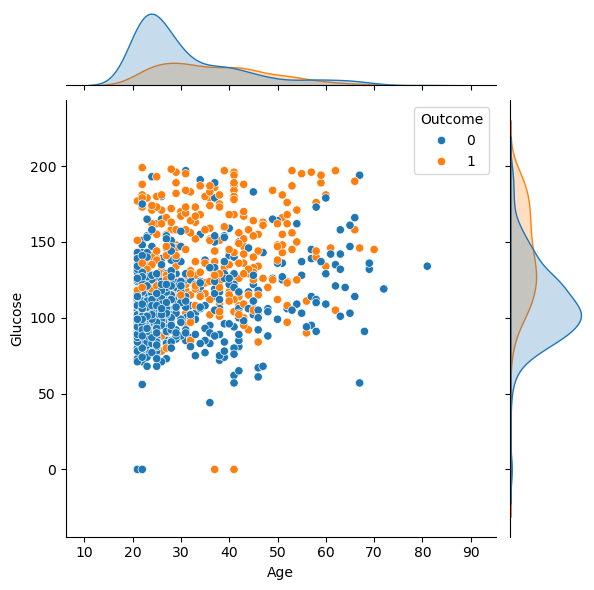

In [1495]:
plt.figure(figsize=(20,10))
plt.tight_layout()
sns.jointplot(x = 'Age',y = 'Glucose',data = diab_data,hue = 'Outcome')

# Machine Learning model for detecting diabetes ->

In [1496]:
X = diab_data.drop(columns=['Outcome'])
X

idx,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,6,148,72,35,0,33.6,0.627,50
1,1,85,66,29,0,26.6,0.351,31
2,8,183,64,0,0,23.3,0.672,32
3,1,89,66,23,94,28.1,0.167,21
4,0,137,40,35,168,43.1,2.288,33
...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.9,0.171,63
764,2,122,70,27,0,36.8,0.340,27
765,5,121,72,23,112,26.2,0.245,30
766,1,126,60,0,0,30.1,0.349,47


In [1497]:
Y = diab_data['Outcome']
Y

0      1
1      0
2      1
3      0
4      1
      ..
763    0
764    0
765    0
766    1
767    0
Name: Outcome, Length: 768, dtype: int64

In [1498]:
from sklearn.tree import DecisionTreeClassifier

In [1499]:
model = DecisionTreeClassifier()
model.fit(X,Y)

DecisionTreeClassifier()

In [1500]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

In [1502]:
from sklearn import tree

In [1503]:
tree.export_graphviz(model, out_file= 'diabetes_detector.dot',
                     feature_names= ['Pregnancies','Glucose','BloodPressure','SkinThickness','Insulin','BMI','DiabetesPedigreeFunction','Age'],
                    label = 'all', 
                     rounded=True,filled = True)

# Decision tree for the diabetes predicting model

https://drive.google.com/file/d/1t1THtr9NXekPUQ04Z_7sLBqFmm_MY9dg/view?usp=sharing

# Taking inputs of your parameters  

In [1504]:
print("This is a diabetes predictor app develouped according to the dataset of thousands of patients",end= '\n\n')
Pregnancies = input("how many times have you been Pregnant")	
Glucose = input("what is your Glucose level")	
BloodPressure = input("what is your Blood Pressure")	
SkinThicknes = input("what is your skin thickness index")
Insulin	= input("what is your Insulin level")
BMI	= input("what is your BMI")
DiabetesPedigreeFunction = input("what is your DiabetesPedigree Function")
Age = input("what is your Age")

test_data = pd.DataFrame({
    'Pregnancies':[Pregnancies,],
    'Glucose':[Glucose,],
    'BloodPressure':[BloodPressure,],
    'SkinThickness':[SkinThicknes,],
    'Insulin':[Insulin,],
    'BMI':[BMI,],
    'DiabetesPedigreeFunction':[DiabetesPedigreeFunction,],
    'Age':[Age,]
})


print(end = '\n\n')

if model.predict(test_data) == 1:
    print('Your chances of having diabetes is HIGH according to your parameters')
else:
    print("Your chances of having diabetes is LOW according to your parameters")

This is a diabetes predictor app develouped according to the dataset of thousands of patients



how many times have you been Pregnant 1
what is your Glucose level 1
what is your Blood Pressure 1
what is your skin thickness index 1
what is your Insulin level 1
what is your BMI 1
what is your DiabetesPedigree Function 1
what is your Age 1




Your chances of having diabetes is LOW according to your parameters


In [1505]:
def findratio(colname):
    diab_age = pd.DataFrame(data=diab_data[diab_data['Outcome'] == 1][colname])
    ratio = diab_age.groupby(diab_age[colname],observed=True)[colname].count()/diab_data.groupby(diab_data[colname],observed=True)[colname].count()
    ratio= pd.DataFrame(data = ratio)
    ratio.columns = ['ratio']
    return ratio

def findratioBMI(colname):
    diab_age = pd.DataFrame(data=diab_data[diab_data['Outcome'] == 1][colname])
    ratio = diab_age.groupby(pd.cut(diab_age[colname], list(np.arange(18, 40, .1))),observed=True)[colname].count()/diab_data.groupby(pd.cut(diab_age[colname], list(np.arange(18, 40, .1))),observed=True)[colname].count()
    ratio= pd.DataFrame(data = ratio)
    ratio.columns = ['ratio']
    return ratio




In [1506]:
ratio_preg = findratio('Pregnancies')
ratio_BloodPressure	= findratio('BloodPressure')
ratio_SkinThickness	= findratio('SkinThickness')
ratio_Insulin = findratio('Insulin')	
ratio_BMI = findratio('BMI')	
ratio_DiabetesPedigreeFunction = findratio('DiabetesPedigreeFunction')

print(ratio_preg[ratio_preg['ratio']<0.5])
print(ratio_BloodPressure[ratio_BloodPressure['ratio']<0.5])
print(ratio_SkinThickness[ratio_SkinThickness['ratio']<0.5])
print(ratio_Insulin[ratio_Insulin['ratio']<0.5])
print(ratio_BMI[ratio_BMI['ratio']<0.3])
print(ratio_DiabetesPedigreeFunction[ratio_DiabetesPedigreeFunction['ratio']<0.5])

                ratio
Pregnancies          
0            0.342342
1            0.214815
2            0.184466
3            0.360000
4            0.338235
5            0.368421
6            0.320000
10           0.416667
12           0.444444
                  ratio
BloodPressure          
0              0.457143
48             0.200000
50             0.384615
52             0.272727
54             0.181818
56             0.083333
58             0.095238
60             0.189189
62             0.294118
64             0.302326
65             0.142857
66             0.366667
68             0.266667
70             0.403509
72             0.363636
74             0.326923
75             0.125000
76             0.461538
78             0.377778
80             0.325000
82             0.433333
86             0.428571
88             0.440000
92             0.375000
96             0.250000
100            0.333333
106            0.333333
                  ratio
SkinThickness          
0             

highly correlated parmeters are glucose ,Pregnancies , Bmi 


# Parameters you should take care of

In [1509]:

f = 2
print('these are the parameters you should take care of :')
for i in test_data:
    if i == 'Glucose':
        if float(test_data[i].values) > ratio_gluc[ratio_gluc['ratio']<0.3].index.max().right:
            f = 1
            print('your',i,'is higher than usual')

    if i == 'Pregnancies':
        if(float(test_data[i].values)> ratio_preg[ratio_preg['ratio']<0.3].index.max()):
            f = 1
            print('your',i,'is higher than usual try to control it')
           
    if i == 'BloodPressure':
        if(float(test_data[i].values)>ratio_BloodPressure[ratio_BloodPressure['ratio']<0.3].index.max()):
            f = 1
            print('your',i,'is higher than usual ')
            
    if i == 'SkinThickness':
        if(float(test_data[i].values)>ratio_SkinThickness[ratio_SkinThickness['ratio']<0.3].index.max()):
            f = 1
            print('your',i,'is higher than usual ')
            
    if i == 'Insulin':
        if(float(test_data[i].values)>ratio_Insulin[ratio_Insulin['ratio']<0.3].index.max()):
            f = 1
            print('your',i,'is higher than usual ')
            
    if i == 'BMI':
        if(float(test_data[i].values)>ratio_BMI[ratio_BMI['ratio']<0.3].index.max()):
            f = 1
            print('your',i,'is higher than usual ')
            
    if i == 'DiabetesPedigreeFunction':
        if(float(test_data[i].values)>ratio_DiabetesPedigreeFunction[ratio_DiabetesPedigreeFunction['ratio']<0.3].index.max()):
            f = 1
            print('your',i,'is higher than usual you are prone to diabetes')
if(f != 1):
    print("You are perfect all your parameters are good")

these are the parameters you should take care of :
your DiabetesPedigreeFunction is higher than usual you are prone to diabetes


# -----------------------END----------------------